# Import Library

In [1]:
#Import semua library
import pm4py
import pandas as pd
import xml.etree.ElementTree as ET
from datetime import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Untuk mengatur penampilan data
pd.set_option('display.max_rows', None)
#pd.reset_option('display.max_rows')

pd.set_option('display.max_colwidth', None)
#pd.reset_option('display.max_colwidth', None)

# Import dataset

In [3]:
# Baca data dari file CSV menggunakan pandas
csv_file_path = 'data-ticket-karyawan-cluster.csv'
data_raw = pd.read_csv(csv_file_path)
data_raw

,sumber,tahun bulan,issue id,tracker,created on,closed on,start date,due date,project,subject,...,poin,id resolver,nama resolver,grup resolver,id creator,nama creator,ts menit,wkt resolved,st lembur,cluster
0,Lapor PPDB,2024-06,21639,Support,2024-06-29 09:09:00,2024-07-01 05:11:11,2024-06-29,2024-06-29,Kota Denpasar,[Closing Engine] Kota Denpasar 2024 - Jalur Zonasi Kategori Umum - Tahap 1,...,NaN,69.0,Febrian Hilmi Firdaus,DSO,69,Febrian Hilmi Firdaus,NaN,2024-06-29 14:30:41,Lembur,Closing Engine
1,Lapor PPDB,2024-06,21662,Support,2024-06-29 12:51:50,2024-07-01 05:10:57,2024-06-29,2024-06-29,Prov. Bali,[Kendala] Siswa Masih Bisa Langsung Pengajuan Pendaftaran di 2 Jenjang Sekaligus,...,NaN,69.0,Febrian Hilmi Firdaus,DSO,69,Febrian Hilmi Firdaus,NaN,2024-07-01 05:10:57,Normal,Pengaturan Pendaftaran
2,Lapor PPDB,2024-06,21088,Support,2024-06-22 05:30:34,2024-06-22 10:18:51,2024-06-22,2024-06-29,Prov. Nusa Tenggara Timur,[Closing Engine] Prov NTT 2024 - SMA All Jalur - Tahap 1,...,NaN,69.0,Febrian Hilmi Firdaus,DSO,69,Febrian Hilmi Firdaus,NaN,2024-06-22 08:54:49,Normal,Closing Engine
3,Lapor PPDB,2024-06,21689,Support,2024-07-01 02:28:58,2024-07-01 02:46:11,2024-06-30,2024-07-01,Kanwil Prov. DKI Jakarta,[DEV] Pengecekan dan Penyesuaian hasil seleksi jalur reguler,...,5.0,4.0,Azhar Mashuri,DIP,4,Azhar Mashuri,NaN,2024-07-01 02:46:06,Lembur,Pengaturan Jalur
4,Lapor PPDB,2024-06,21479,Support,2024-06-26 14:13:47,2024-07-01 01:27:33,2024-06-26,2024-06-26,Kota Sukabumi,Pengecekan File Ajuan Pendaftaran di Operator Tidak Terbuka,...,NaN,74.0,Hayan .,DSO,74,Hayan .,NaN,2024-06-26 14:24:31,Normal,Pengaturan Pendaftaran
5,Lapor PPDB,2024-06,21680,Support,2024-06-30 19:56:25,2024-06-30 22:43:27,2024-06-30,2024-06-30,Kota Serang,[DEV] Backend - Tolak Pilihan Provinsi Dan Kota Selain Prov. Banten dan Kota Serang Jalur Zonasi dan PTO,...,1.0,62.0,Villa Nanda,DIP,4,Azhar Mashuri,NaN,2024-06-30 21:41:11,Lembur,Pengaturan Jalur
6,Lapor PPDB,2024-06,21612,Support,2024-06-28 17:30:55,2024-06-30 22:08:07,NaN,2024-06-29,Prov. DI Yogyakarta,[Prov DIY]Req menambahkan kolom info NIK pada unduhan Laporan Hasil Seleksi Akhir,...,NaN,41.0,Ghazi Muwaffaq,DSO,41,Ghazi Muwaffaq,NaN,2024-06-30 22:08:07,Lembur,Pengaturan Pendaftaran
7,Lapor PPDB,2024-06,21673,Support,2024-06-30 12:16:57,2024-06-30 22:07:44,NaN,2024-06-30,Kab. Purbalingga,"[Closing Engine] Kab Purbalingga 2024 - Jalur Zonasi Khusus, Afirmasi, Zonasi Reguler, Prestasi dan PTO - Tahap 1",...,NaN,41.0,Ghazi Muwaffaq,DSO,41,Ghazi Muwaffaq,NaN,2024-06-30 18:51:52,Lembur,Closing Engine
8,Lapor PPDB,2024-06,21681,Support,2024-06-30 19:58:34,2024-06-30 20:53:05,2024-06-30,2024-06-30,Kota Serang,[DEV] Frontend - Disable Pilihan Provinsi Dan Kota Jalur Zonasi dan PTO,...,1.0,7.0,Kukuh Ari Susanto,DIP,4,Azhar Mashuri,NaN,2024-06-30 20:06:17,Lembur,Pengaturan Jalur
9,Lapor PPDB,2024-06,21679,Support,2024-06-30 19:54:35,2024-06-30 20:51:48,2024-06-30,2024-07-01,Kota Serang,[DEV] Override - Hide Unggahan Suket Domisili Untuk Siswa Anak Guru,...,1.0,62.0,Villa Nanda,DIP,4,Azhar Mashuri,NaN,2024-06-30 20:39:10,Lembur,Override


In [4]:
data_raw[data_raw.duplicated()]

,sumber,tahun bulan,issue id,tracker,created on,closed on,start date,due date,project,subject,...,poin,id resolver,nama resolver,grup resolver,id creator,nama creator,ts menit,wkt resolved,st lembur,cluster
40,Lapor PPDB,2024-06,20552,Support,2024-06-13 22:55:19,2024-06-29 08:30:33,NaN,2024-06-15,Problem Handling EOS,[Kab Sleman] Data siswa Sleman 2024,...,NaN,14.0,Mochamad Rifai,NaN,14,Mochamad Rifai,NaN,2024-06-15 11:06:53,Normal,Migrasi Data
41,Lapor PPDB,2024-06,20552,Support,2024-06-13 22:55:19,2024-06-29 08:30:33,NaN,2024-06-15,Problem Handling EOS,[Kab Sleman] Data siswa Sleman 2024,...,NaN,14.0,Mochamad Rifai,NaN,14,Mochamad Rifai,NaN,2024-06-15 11:06:53,Normal,Migrasi Data
63,Lapor PPDB,2024-06,21540,Support,2024-06-27 09:19:39,2024-06-28 15:29:42,2024-06-27,2024-06-28,Kota Serang,[Up Situs Publik] Kota Serang 2024,...,NaN,74.0,Hayan .,DSO,74,Hayan .,NaN,2024-06-27 17:10:42,Lembur,Up Situs Publik
65,Lapor PPDB,2024-06,21473,Support,2024-06-26 13:51:08,2024-06-28 15:29:12,2024-06-26,2024-06-27,Kota Serang,Override - Perubahan Redaksi Pendaftaran Siswa Database,...,NaN,74.0,Hayan .,DSO,74,Hayan .,NaN,2024-06-27 12:18:49,Normal,Override
88,Lapor PPDB,2024-06,20916,Support,2024-06-20 06:37:59,2024-06-27 21:35:15,NaN,2024-06-20,Kab. Berau,[Up Situs Publik] Kab. Berau 2024,...,NaN,64.0,Badrul Munir,DSO,64,Badrul Munir,NaN,2024-06-20 11:18:11,Normal,Up Situs Publik
93,Lapor PPDB,2024-06,20826,Support,2024-06-18 16:46:33,2024-06-27 21:33:02,NaN,2024-06-18,Kota Banjarbaru,Penambahan aksses Password untuk Situs Demo,...,NaN,64.0,Badrul Munir,DSO,64,Badrul Munir,NaN,2024-06-27 21:33:02,Lembur,Pengaturan Situs Demo
94,Lapor PPDB,2024-06,20826,Support,2024-06-18 16:46:33,2024-06-27 21:33:02,NaN,2024-06-18,Kota Banjarbaru,Penambahan aksses Password untuk Situs Demo,...,NaN,64.0,Badrul Munir,DSO,64,Badrul Munir,NaN,2024-06-27 21:33:02,Lembur,Pengaturan Situs Demo
95,Lapor PPDB,2024-06,20826,Support,2024-06-18 16:46:33,2024-06-27 21:33:02,NaN,2024-06-18,Kota Banjarbaru,Penambahan aksses Password untuk Situs Demo,...,NaN,64.0,Badrul Munir,DSO,64,Badrul Munir,NaN,2024-06-27 21:33:02,Lembur,Pengaturan Situs Demo
105,Lapor PPDB,2024-06,21247,Support,2024-06-23 23:38:42,2024-06-24 05:10:54,2024-06-23,2024-06-24,Kota Bengkulu,Proses Migrasi Data Master Siswa,...,1.0,84.0,Rizky Adi Prasetyo,DLA,84,Rizky Adi Prasetyo,60.000000,2024-06-23 23:43:11,Lembur,Migrasi Data
106,Lapor PPDB,2024-06,21247,Support,2024-06-23 23:38:42,2024-06-24 05:10:54,2024-06-23,2024-06-24,Kota Bengkulu,Proses Migrasi Data Master Siswa,...,1.0,84.0,Rizky Adi Prasetyo,DLA,84,Rizky Adi Prasetyo,60.000000,2024-06-23 23:43:11,Lembur,Migrasi Data


In [5]:
data_raw = data_raw.drop_duplicates(keep='first')

In [6]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2042 entries, 0 to 2293
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   sumber         2042 non-null   object 
 1   tahun bulan    2042 non-null   object 
 2   issue id       2042 non-null   int64  
 3   tracker        2042 non-null   object 
 4   created on     2042 non-null   object 
 5   closed on      2042 non-null   object 
 6   start date     1636 non-null   object 
 7   due date       2042 non-null   object 
 8   project        2042 non-null   object 
 9   subject        2042 non-null   object 
 10  state          2042 non-null   object 
 11  poin           1718 non-null   float64
 12  id resolver    2042 non-null   float64
 13  nama resolver  2042 non-null   object 
 14  grup resolver  1958 non-null   object 
 15  id creator     2042 non-null   int64  
 16  nama creator   2042 non-null   object 
 17  ts menit       374 non-null    float64
 18  wkt resolved 

## Pilih Kolom

In [7]:
data = data_raw.drop(['sumber','tahun bulan','issue id','tracker','closed on','start date','due date','subject','id resolver','id creator','nama creator','ts menit','st lembur','state','poin'], axis=1)
data

,created on,project,nama resolver,grup resolver,wkt resolved,cluster
0,2024-06-29 09:09:00,Kota Denpasar,Febrian Hilmi Firdaus,DSO,2024-06-29 14:30:41,Closing Engine
1,2024-06-29 12:51:50,Prov. Bali,Febrian Hilmi Firdaus,DSO,2024-07-01 05:10:57,Pengaturan Pendaftaran
2,2024-06-22 05:30:34,Prov. Nusa Tenggara Timur,Febrian Hilmi Firdaus,DSO,2024-06-22 08:54:49,Closing Engine
3,2024-07-01 02:28:58,Kanwil Prov. DKI Jakarta,Azhar Mashuri,DIP,2024-07-01 02:46:06,Pengaturan Jalur
4,2024-06-26 14:13:47,Kota Sukabumi,Hayan .,DSO,2024-06-26 14:24:31,Pengaturan Pendaftaran
5,2024-06-30 19:56:25,Kota Serang,Villa Nanda,DIP,2024-06-30 21:41:11,Pengaturan Jalur
6,2024-06-28 17:30:55,Prov. DI Yogyakarta,Ghazi Muwaffaq,DSO,2024-06-30 22:08:07,Pengaturan Pendaftaran
7,2024-06-30 12:16:57,Kab. Purbalingga,Ghazi Muwaffaq,DSO,2024-06-30 18:51:52,Closing Engine
8,2024-06-30 19:58:34,Kota Serang,Kukuh Ari Susanto,DIP,2024-06-30 20:06:17,Pengaturan Jalur
9,2024-06-30 19:54:35,Kota Serang,Villa Nanda,DIP,2024-06-30 20:39:10,Override


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2042 entries, 0 to 2293
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   created on     2042 non-null   object
 1   project        2042 non-null   object
 2   nama resolver  2042 non-null   object
 3   grup resolver  1958 non-null   object
 4   wkt resolved   2042 non-null   object
 5   cluster        2042 non-null   object
dtypes: object(6)
memory usage: 111.7+ KB


## Setting Waktu

In [9]:
#Mengubah ke datetime
data['created on'] = pd.to_datetime(data['created on'])
data['wkt resolved'] = pd.to_datetime(data['wkt resolved'])

In [10]:
data

,created on,project,nama resolver,grup resolver,wkt resolved,cluster
0,2024-06-29 09:09:00,Kota Denpasar,Febrian Hilmi Firdaus,DSO,2024-06-29 14:30:41,Closing Engine
1,2024-06-29 12:51:50,Prov. Bali,Febrian Hilmi Firdaus,DSO,2024-07-01 05:10:57,Pengaturan Pendaftaran
2,2024-06-22 05:30:34,Prov. Nusa Tenggara Timur,Febrian Hilmi Firdaus,DSO,2024-06-22 08:54:49,Closing Engine
3,2024-07-01 02:28:58,Kanwil Prov. DKI Jakarta,Azhar Mashuri,DIP,2024-07-01 02:46:06,Pengaturan Jalur
4,2024-06-26 14:13:47,Kota Sukabumi,Hayan .,DSO,2024-06-26 14:24:31,Pengaturan Pendaftaran
5,2024-06-30 19:56:25,Kota Serang,Villa Nanda,DIP,2024-06-30 21:41:11,Pengaturan Jalur
6,2024-06-28 17:30:55,Prov. DI Yogyakarta,Ghazi Muwaffaq,DSO,2024-06-30 22:08:07,Pengaturan Pendaftaran
7,2024-06-30 12:16:57,Kab. Purbalingga,Ghazi Muwaffaq,DSO,2024-06-30 18:51:52,Closing Engine
8,2024-06-30 19:58:34,Kota Serang,Kukuh Ari Susanto,DIP,2024-06-30 20:06:17,Pengaturan Jalur
9,2024-06-30 19:54:35,Kota Serang,Villa Nanda,DIP,2024-06-30 20:39:10,Override


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2042 entries, 0 to 2293
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   created on     2042 non-null   datetime64[ns]
 1   project        2042 non-null   object        
 2   nama resolver  2042 non-null   object        
 3   grup resolver  1958 non-null   object        
 4   wkt resolved   2042 non-null   datetime64[ns]
 5   cluster        2042 non-null   object        
dtypes: datetime64[ns](2), object(4)
memory usage: 111.7+ KB


# Preproces

## data kosong

In [12]:
#Mengecek data kosong
data.isna().sum()

created on        0
project           0
nama resolver     0
grup resolver    84
wkt resolved      0
cluster           0
dtype: int64

In [13]:
data['grup resolver']=data['grup resolver'].fillna('Tanpa Divisi')
data

,created on,project,nama resolver,grup resolver,wkt resolved,cluster
0,2024-06-29 09:09:00,Kota Denpasar,Febrian Hilmi Firdaus,DSO,2024-06-29 14:30:41,Closing Engine
1,2024-06-29 12:51:50,Prov. Bali,Febrian Hilmi Firdaus,DSO,2024-07-01 05:10:57,Pengaturan Pendaftaran
2,2024-06-22 05:30:34,Prov. Nusa Tenggara Timur,Febrian Hilmi Firdaus,DSO,2024-06-22 08:54:49,Closing Engine
3,2024-07-01 02:28:58,Kanwil Prov. DKI Jakarta,Azhar Mashuri,DIP,2024-07-01 02:46:06,Pengaturan Jalur
4,2024-06-26 14:13:47,Kota Sukabumi,Hayan .,DSO,2024-06-26 14:24:31,Pengaturan Pendaftaran
5,2024-06-30 19:56:25,Kota Serang,Villa Nanda,DIP,2024-06-30 21:41:11,Pengaturan Jalur
6,2024-06-28 17:30:55,Prov. DI Yogyakarta,Ghazi Muwaffaq,DSO,2024-06-30 22:08:07,Pengaturan Pendaftaran
7,2024-06-30 12:16:57,Kab. Purbalingga,Ghazi Muwaffaq,DSO,2024-06-30 18:51:52,Closing Engine
8,2024-06-30 19:58:34,Kota Serang,Kukuh Ari Susanto,DIP,2024-06-30 20:06:17,Pengaturan Jalur
9,2024-06-30 19:54:35,Kota Serang,Villa Nanda,DIP,2024-06-30 20:39:10,Override


## data unique

In [14]:
data.nunique()

created on       2035
project            56
nama resolver      46
grup resolver       8
wkt resolved     2036
cluster            13
dtype: int64

# visualisasi data

## Project

In [15]:
data['project'].value_counts()

project
Prov. Jawa Tengah                       213
Bispro                                  196
Prov. DKI Jakarta                       142
Prov. DI Yogyakarta                     106
SIAP PPDB                               103
Prov. Banten                             75
Kota Yogyakarta                          73
Problem Handling EOS                     72
Prov. Bali                               67
Prov. Jambi                              62
Kab. Bantul                              45
Kab. Batang                              45
Kanwil Prov. DKI Jakarta                 42
Prov. Kalimantan Tengah                  39
Cabdin Kota Samarinda                    38
Kota Pontianak                           36
Cabdin Kota Balikpapan                   30
Kota Palangkaraya                        29
Kota Batu                                27
Kab. Pati                                27
Kab. Kulon Progo                         26
Kab. Klaten                              26
Kab. Gresik             

/var/folders/m8/_0cj2g7567gfmpcm4lg826wh0000gn/T/ipykernel_6205/2448304213.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='project', data=data, palette="viridis")


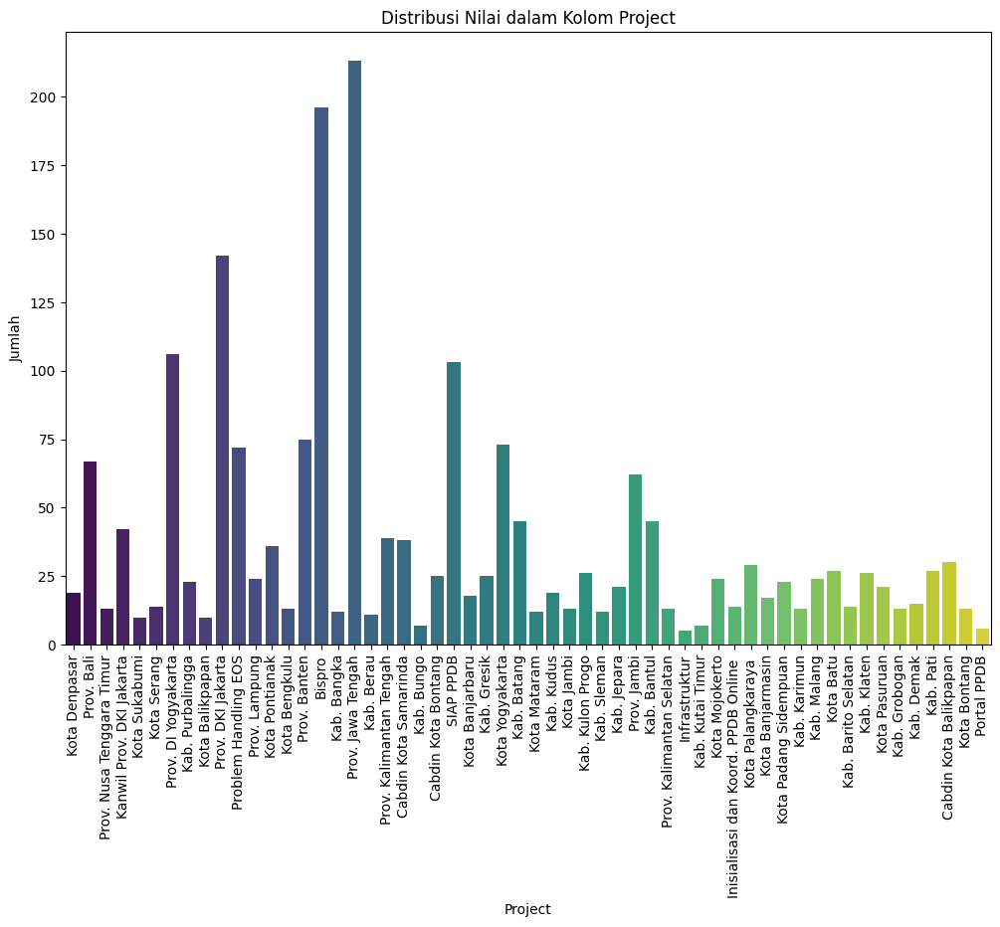

In [16]:
plt.figure(figsize=(12,8))
sns.countplot(x='project', data=data, palette="viridis")
plt.xlabel('Project')
plt.ylabel('Jumlah')
plt.title('Distribusi Nilai dalam Kolom Project')
plt.xticks(rotation=90)  # Memutar label sumbu x jika perlu
plt.show()

## Nama resolver

In [17]:
data['nama resolver'].value_counts()

nama resolver
Azhar Mashuri                           228
Kukuh Ari Susanto                       186
ahmad nashruddin                        157
Hamzah Hamzah                           156
Ghazi Muwaffaq                          107
Rizky Adi Prasetyo                      105
Kukuh Rahmadani                         104
Sandrian Yulian Firmansyah Noorihsan     71
Achmad Fauzi                             71
Febrian Hilmi Firdaus                    69
Badrul  Munir                            66
Mochamad Aldino Beta Giosanfi            66
Rifki Ainul Riza                         64
Villa Nanda                              61
Rahman rahman                            56
Hayan .                                  47
Muhammad Irfan                           43
Mochamad Rifai                           41
Aseanti Kirana                           37
Danang Wahyu                             30
Tsany Afif                               28
Fahmiko Purnama Putra                    25
Bayu Hakim        

/var/folders/m8/_0cj2g7567gfmpcm4lg826wh0000gn/T/ipykernel_6205/3582965161.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='nama resolver', data=data, palette="viridis")


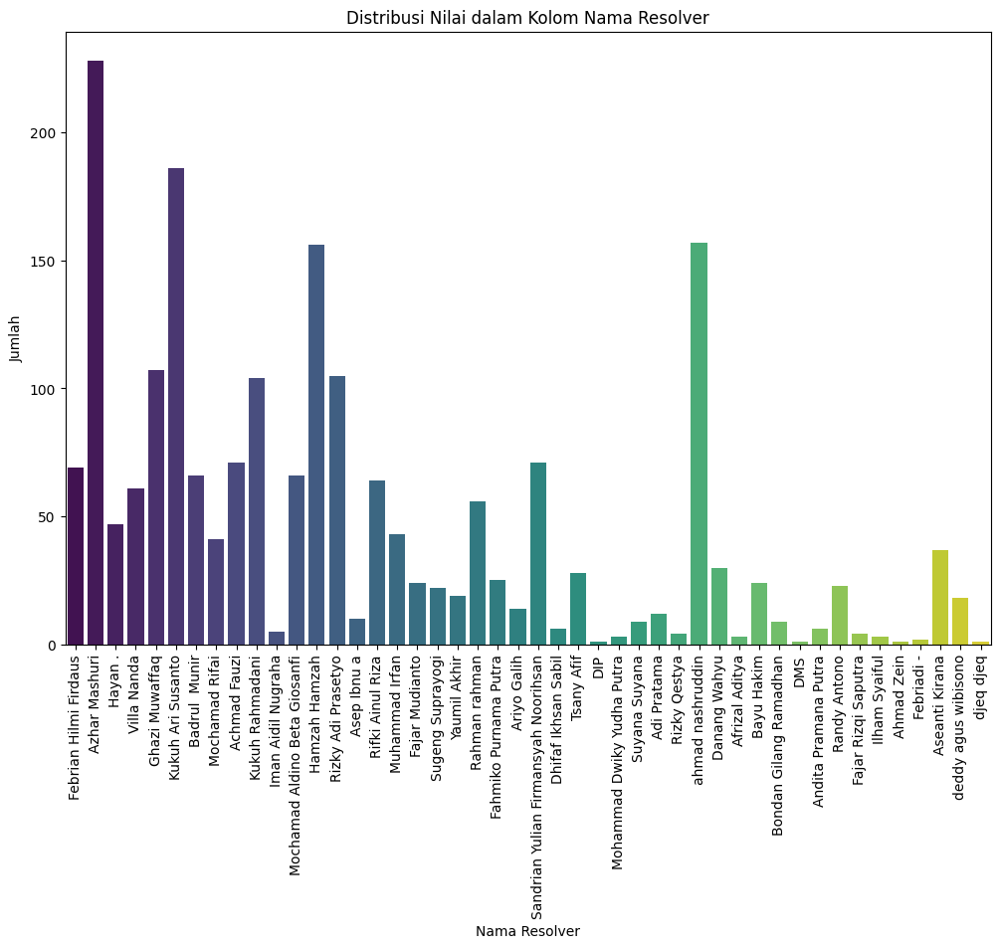

In [18]:
plt.figure(figsize=(12,8))
sns.countplot(x='nama resolver', data=data, palette="viridis")
plt.xlabel('Nama Resolver')
plt.ylabel('Jumlah')
plt.title('Distribusi Nilai dalam Kolom Nama Resolver')
plt.xticks(rotation=90)  # Memutar label sumbu x jika perlu
plt.show()

## grup resolver

In [19]:
data['grup resolver'].value_counts()

grup resolver
DIP             642
DSO             639
DLA             354
DMS             137
DBM             128
Tanpa Divisi     84
DAK,DBM          55
DAK               3
Name: count, dtype: int64

/var/folders/m8/_0cj2g7567gfmpcm4lg826wh0000gn/T/ipykernel_6205/338335330.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='grup resolver', data=data, palette="viridis")


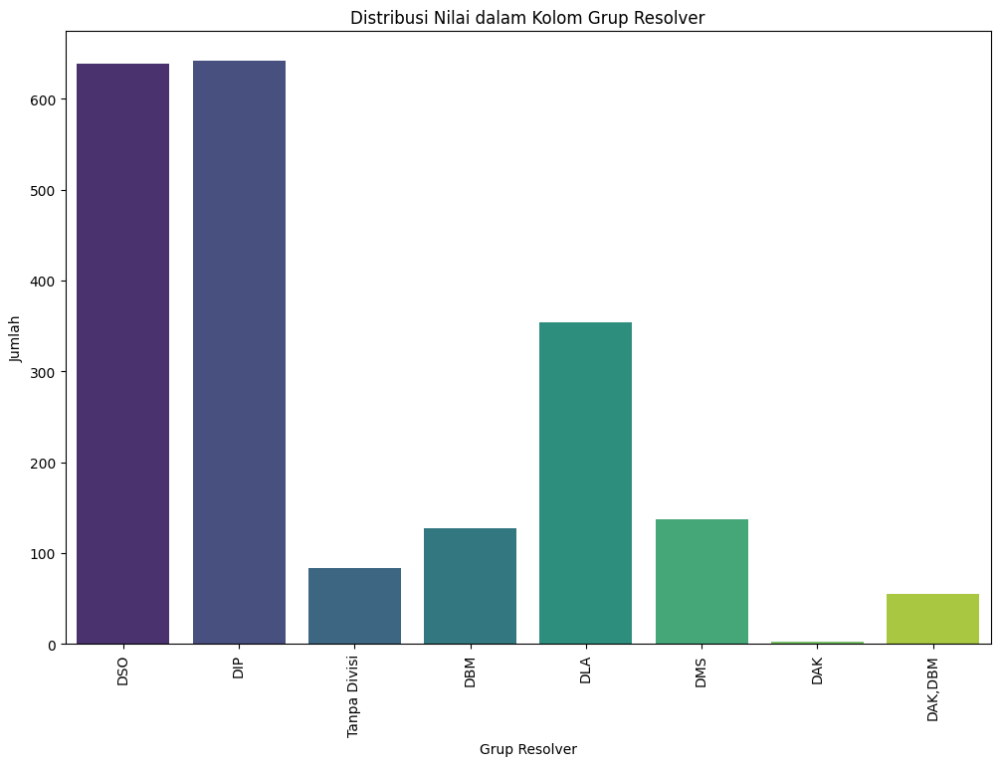

In [20]:
plt.figure(figsize=(12,8))
sns.countplot(x='grup resolver', data=data, palette="viridis")
plt.xlabel('Grup Resolver')
plt.ylabel('Jumlah')
plt.title('Distribusi Nilai dalam Kolom Grup Resolver')
plt.xticks(rotation=90)  # Memutar label sumbu x jika perlu
plt.show()

## cluster

In [21]:
data['cluster'].value_counts()

cluster
Pengaturan Pendaftaran               529
Migrasi Data                         280
Administrasi                         217
Konfigurasi                          209
Deploy Real                          164
Pengaturan Pendataan                 143
Up Situs Publik                      129
Override                             101
Pengaturan Hak Akses dan Operator     77
Pengaturan Jalur                      73
Pengaturan Situs Demo                 47
Closing Engine                        38
Pengaturan Banner/Logo                35
Name: count, dtype: int64

/var/folders/m8/_0cj2g7567gfmpcm4lg826wh0000gn/T/ipykernel_6205/635145525.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='cluster', data=data, palette="viridis")


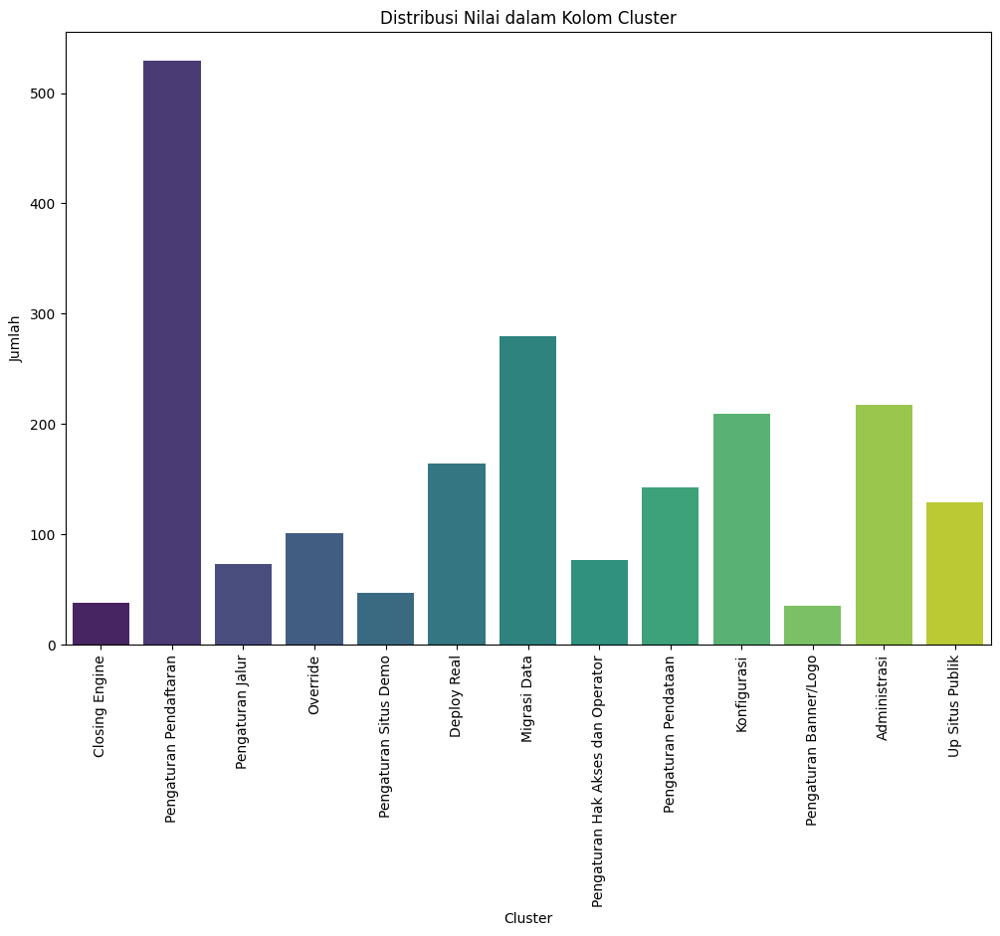

In [22]:
plt.figure(figsize=(12,8))
sns.countplot(x='cluster', data=data, palette="viridis")
plt.xlabel('Cluster')
plt.ylabel('Jumlah')
plt.title('Distribusi Nilai dalam Kolom Cluster')
plt.xticks(rotation=90)  # Memutar label sumbu x jika perlu
plt.show()

# Data to event log

In [23]:
# Format the DataFrame into the event log structure
event_log_df = pm4py.format_dataframe(data, case_id='project',
                                      activity_key='cluster', timestamp_key='created on')

In [24]:
event_log_df.rename(columns={'nama resolver': 'org:resource'}, inplace=True)
event_log_df

,created on,project,org:resource,grup resolver,wkt resolved,cluster,case:concept:name,concept:name,time:timestamp,@@index,@@case_index
0,2022-05-12 16:01:21+00:00,Bispro,Bondan Gilang Ramadhan,DBM,2022-05-24 09:14:04+00:00,Administrasi,Bispro,Administrasi,2022-05-12 16:01:21+00:00,0,0
1,2023-04-06 12:22:26+00:00,Bispro,ahmad nashruddin,DSO,2023-05-11 15:33:12+00:00,Administrasi,Bispro,Administrasi,2023-04-06 12:22:26+00:00,1,0
2,2023-06-14 14:25:19+00:00,Bispro,Bondan Gilang Ramadhan,DBM,2023-06-15 09:31:32+00:00,Administrasi,Bispro,Administrasi,2023-06-14 14:25:19+00:00,2,0
3,2023-07-24 11:49:54+00:00,Bispro,Mochamad Aldino Beta Giosanfi,DBM,2024-05-02 09:22:37+00:00,Pengaturan Pendaftaran,Bispro,Pengaturan Pendaftaran,2023-07-24 11:49:54+00:00,3,0
4,2023-07-27 09:39:50+00:00,Bispro,Bondan Gilang Ramadhan,DBM,2023-08-29 08:24:42+00:00,Administrasi,Bispro,Administrasi,2023-07-27 09:39:50+00:00,4,0
5,2023-08-09 13:13:51+00:00,Bispro,deddy agus wibisono,"DAK,DBM",2023-08-23 11:08:01+00:00,Administrasi,Bispro,Administrasi,2023-08-09 13:13:51+00:00,5,0
6,2023-08-09 13:19:35+00:00,Bispro,deddy agus wibisono,"DAK,DBM",2023-11-16 11:24:28+00:00,Administrasi,Bispro,Administrasi,2023-08-09 13:19:35+00:00,6,0
7,2023-08-09 13:20:42+00:00,Bispro,deddy agus wibisono,"DAK,DBM",2023-10-24 17:06:21+00:00,Administrasi,Bispro,Administrasi,2023-08-09 13:20:42+00:00,7,0
8,2023-08-28 11:23:57+00:00,Bispro,Bondan Gilang Ramadhan,DBM,2024-06-12 11:17:45+00:00,Administrasi,Bispro,Administrasi,2023-08-28 11:23:57+00:00,8,0
9,2023-08-28 11:28:02+00:00,Bispro,Bondan Gilang Ramadhan,DBM,2024-06-12 11:17:31+00:00,Administrasi,Bispro,Administrasi,2023-08-28 11:28:02+00:00,9,0


In [25]:
# Convert the DataFrame to an event log
event_log = pm4py.convert_to_event_log(event_log_df)

# Now you can proceed with your social network analysis

# Process Mining

In [26]:
def start_end_xes(file_path):
    start_activities = pm4py.get_start_activities(file_path)
    end_activities = pm4py.get_end_activities(file_path)
    print("Start activities: {}\nEnd activities: {}".format(start_activities, end_activities))

start_end_xes(event_log)

Start activities: {'Administrasi': 5, 'Pengaturan Hak Akses dan Operator': 8, 'Closing Engine': 6, 'Pengaturan Pendataan': 4, 'Up Situs Publik': 7, 'Pengaturan Situs Demo': 7, 'Migrasi Data': 8, 'Pengaturan Pendaftaran': 5, 'Override': 3, 'Konfigurasi': 2, 'Deploy Real': 1}
End activities: {'Administrasi': 2, 'Konfigurasi': 6, 'Pengaturan Pendaftaran': 16, 'Migrasi Data': 8, 'Closing Engine': 13, 'Deploy Real': 2, 'Pengaturan Pendataan': 4, 'Pengaturan Jalur': 2, 'Pengaturan Situs Demo': 1, 'Override': 1, 'Pengaturan Hak Akses dan Operator': 1}


# Process Discovery

In [27]:
import graphviz
import pydot

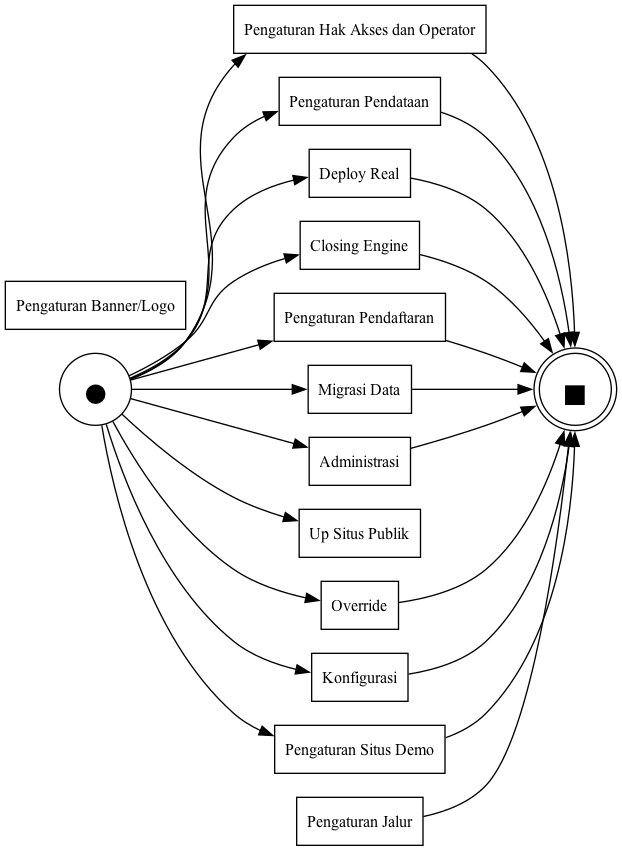

In [28]:
net_alpha, initial_marking, final_marking = pm4py.discover_petri_net_alpha(event_log)
pm4py.view_petri_net(net_alpha, initial_marking, final_marking)

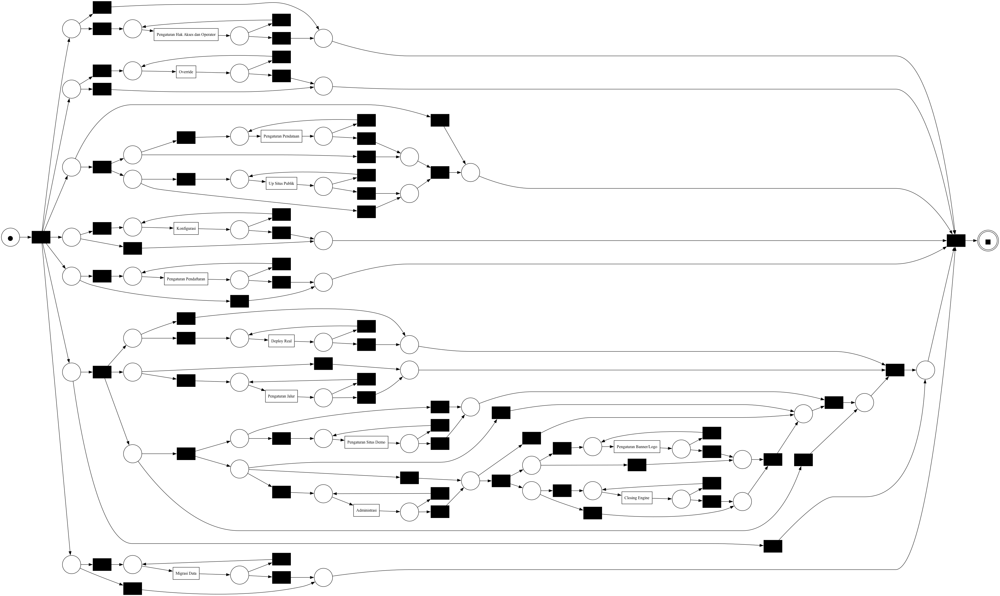

In [29]:
net_ind, initial_marking, final_marking = pm4py.discover_petri_net_inductive(event_log)
pm4py.view_petri_net(net_ind, initial_marking, final_marking)

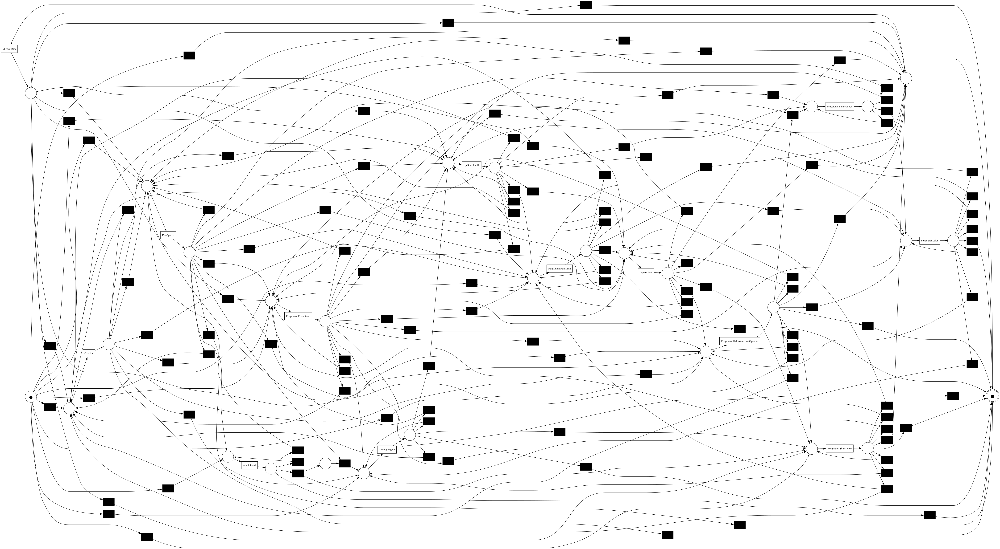

In [30]:
net_heu, initial_marking, final_marking = pm4py.discover_petri_net_heuristics(event_log)
pm4py.view_petri_net(net_heu, initial_marking, final_marking)

discovering Petri net using ILP miner, completed causal relations ::   0%|          | 0/32 [00:00<?, ?it/s]

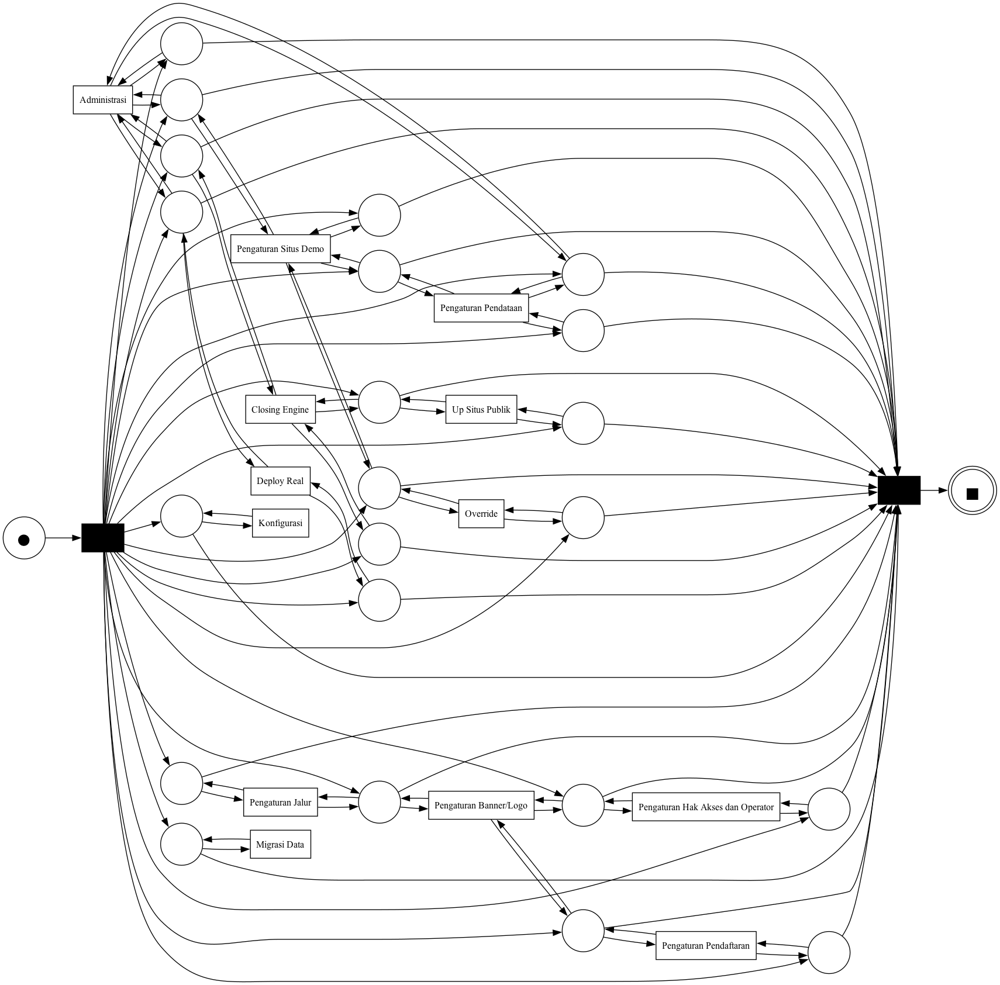

In [31]:
net_ilp, initial_marking, final_marking = pm4py.discover_petri_net_ilp(event_log)
pm4py.view_petri_net(net_ilp, initial_marking, final_marking)

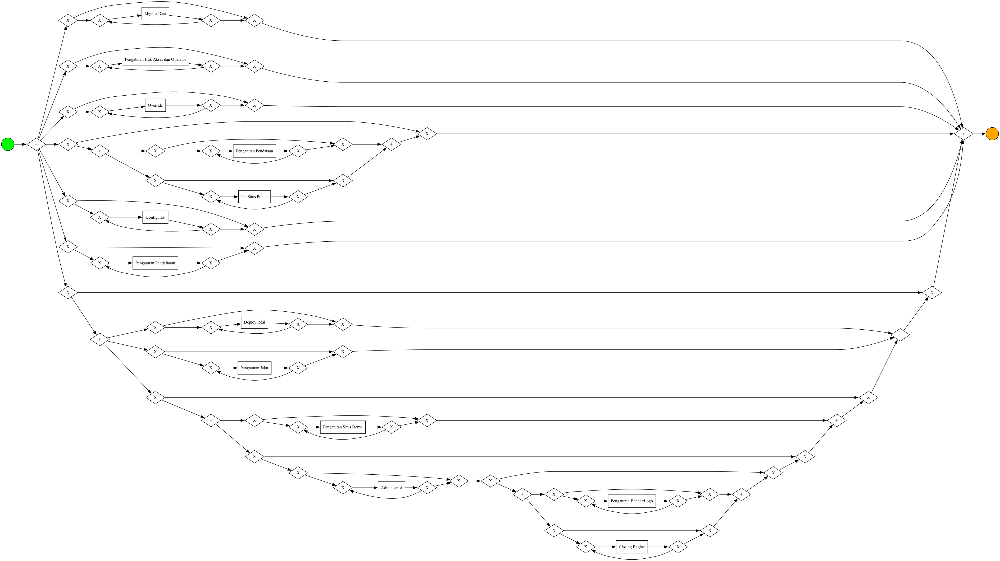

In [32]:
bpmn_model = pm4py.discover_bpmn_inductive(event_log)
pm4py.view_bpmn(bpmn_model)

# SNA

In [33]:
from pm4py.algo.organizational_mining.sna.variants.log import handover, jointactivities, subcontracting, working_together


## handover

In [34]:
# Apply handover analysis
sna_result = handover.apply(event_log)

In [35]:
# Inspect available attributes and methods
print("Available methods and attributes:")
print(dir(sna_result))

# Check if there are attributes related to handover matrix or similar
if hasattr(sna_result, 'connections'):
    print("Connections (Handover Matrix):")
    print(sna_result.connections)

# Check if there is another way to access handover matrix
# Try accessing attributes or methods related to matrix or result
if hasattr(sna_result, 'get_handover_matrix'):
    handover_matrix = sna_result.get_handover_matrix()
    print("Handover Matrix:")
    print(handover_matrix)
else:
    print("No direct method to get handover matrix found.")

Available methods and attributes:
['__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'connections', 'is_directed']
Connections (Handover Matrix):
{('Bondan Gilang Ramadhan', 'ahmad nashruddin'): 0.0005035246727089627, ('Bondan Gilang Ramadhan', 'Mochamad Aldino Beta Giosanfi'): 0.0010070493454179255, ('Bondan Gilang Ramadhan', 'deddy agus wibisono'): 0.0015105740181268882, ('Bondan Gilang Ramadhan', 'Bondan Gilang Ramadhan'): 0.0005035246727089627, ('Bondan Gilang Ramadhan', 'Fajar Rizqi Saputra'): 0.0005035246727089627, ('Bondan Gilang Ramadhan', 'Asep Ibnu a'): 0.0005035246727089627, ('ahmad nashruddin', 'Bondan Gilang Ramadhan'): 0.0005035246727089627, ('ahmad

connections: This is a dictionary that shows the strength of connection (or interaction) between pairs of individuals. For example, the pair ('Bondan Gilang Ramadhan', 'ahmad nashruddin') has a connection strength of 0.0005035246727089627.

is_directed: This attribute typically indicates whether the connections are directed or not. In a directed network, the connections have a direction (i.e., from one person to another), while in an undirected network, the connections are bidirectional.

In [36]:
import numpy as np
import pandas as pd

# Replace with your actual dictionary from sna_result
handover_dict = sna_result.connections  # Assuming this is the correct attribute

# Extract unique names from the dictionary keys
names = sorted(set(name for pair in handover_dict.keys() for name in pair))

# Create a matrix and a mapping from names to indices
size = len(names)
matrix = np.zeros((size, size))
name_to_index = {name: i for i, name in enumerate(names)}

# Populate the matrix with values from the dictionary
for (from_name, to_name), value in handover_dict.items():
    matrix[name_to_index[from_name], name_to_index[to_name]] = value

# Convert the matrix to a DataFrame for easier viewing
df_matrix = pd.DataFrame(matrix, index=names, columns=names)

df_matrix

,Achmad Fauzi,Adi Pratama,Afrizal Aditya,Ahmad Zein,Andita Pramana Putra,Ariyo Galih,Aseanti Kirana,Asep Ibnu a,Azhar Mashuri,Badrul Munir,...,Rizky Qestya,Sandrian Yulian Firmansyah Noorihsan,Sugeng Suprayogi,Suyana Suyana,Tsany Afif,Villa Nanda,Yaumil Akhir,ahmad nashruddin,deddy agus wibisono,djeq djeq
Achmad Fauzi,0.012588,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006546,0.000000,...,0.000000,0.000000,0.001007,0.000000,0.000000,0.000000,0.001007,0.000000,0.000000,0.0
Adi Pratama,0.000000,0.001511,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001511,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000504,0.000000,0.000504,0.000000,0.0
Afrizal Aditya,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000504,0.000000,0.000000,0.000000,0.000000,0.000000,0.000504,0.000000,0.0
Ahmad Zein,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
Andita Pramana Putra,0.000000,0.000000,0.000000,0.000000,0.002518,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000504,0.000000,0.0
Ariyo Galih,0.000000,0.000000,0.000000,0.000000,0.000000,0.001511,0.000000,0.000000,0.000504,0.000504,...,0.000000,0.000504,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
Aseanti Kirana,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.016113,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001007,0.0
Asep Ibnu a,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002014,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000504,0.000000,0.000000,0.000000,0.000504,0.000504,0.0
Azhar Mashuri,0.007049,0.000504,0.000000,0.000000,0.000000,0.001007,0.000000,0.000000,0.016113,0.000504,...,0.000000,0.000504,0.002518,0.000000,0.006042,0.003525,0.001007,0.006042,0.000000,0.0
Badrul Munir,0.000000,0.000000,0.000000,0.000000,0.000000,0.000504,0.000000,0.000000,0.002014,0.009567,...,0.000000,0.004532,0.000504,0.000000,0.000000,0.000504,0.000000,0.000000,0.000000,0.0


In [41]:
from sklearn.preprocessing import MinMaxScaler

# Normalize the matrix values to range 0 to 1
scaler = MinMaxScaler()
matrix_normalized = scaler.fit_transform(matrix)

# Convert to DataFrame for better readability
df_matrix_normalized = pd.DataFrame(matrix_normalized, index=names, columns=names)

# Apply custom formatting to show zeros without decimal places
df_matrix_normalized = df_matrix_normalized.applymap(lambda x: 0 if x == 0 else round(x, 2))

print("Normalized Matrix:")
df_matrix_normalized

Normalized Matrix:


/var/folders/m8/_0cj2g7567gfmpcm4lg826wh0000gn/T/ipykernel_6205/3318319857.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_matrix_normalized = df_matrix_normalized.applymap(lambda x: 0 if x == 0 else round(x, 2))


,Achmad Fauzi,Adi Pratama,Afrizal Aditya,Ahmad Zein,Andita Pramana Putra,Ariyo Galih,Aseanti Kirana,Asep Ibnu a,Azhar Mashuri,Badrul Munir,...,Rizky Qestya,Sandrian Yulian Firmansyah Noorihsan,Sugeng Suprayogi,Suyana Suyana,Tsany Afif,Villa Nanda,Yaumil Akhir,ahmad nashruddin,deddy agus wibisono,djeq djeq
Achmad Fauzi,1.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.41,0.00,...,0.0,0.00,0.4,0.00,0.00,0.00,0.67,0.00,0.00,0
Adi Pratama,0.00,1.00,0.0,0.0,0.0,0.00,0.00,0.00,0.09,0.00,...,0.0,0.00,0.0,0.00,0.00,0.07,0.00,0.02,0.00,0
Afrizal Aditya,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.06,0.0,0.00,0.00,0.00,0.00,0.02,0.00,0
Ahmad Zein,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0
Andita Pramana Putra,0.00,0.00,0.0,0.0,1.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.02,0.00,0
Ariyo Galih,0.00,0.00,0.0,0.0,0.0,1.00,0.00,0.00,0.03,0.05,...,0.0,0.06,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0
Aseanti Kirana,0.00,0.00,0.0,0.0,0.0,0.00,1.00,0.00,0.00,0.00,...,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.18,0
Asep Ibnu a,0.00,0.00,0.0,0.0,0.0,0.00,0.00,1.00,0.00,0.00,...,0.0,0.00,0.0,0.33,0.00,0.00,0.00,0.02,0.09,0
Azhar Mashuri,0.56,0.33,0.0,0.0,0.0,0.67,0.00,0.00,1.00,0.05,...,0.0,0.06,1.0,0.00,1.00,0.50,0.67,0.22,0.00,0
Badrul Munir,0.00,0.00,0.0,0.0,0.0,0.33,0.00,0.00,0.12,1.00,...,0.0,0.53,0.2,0.00,0.00,0.07,0.00,0.00,0.00,0


In [44]:
# Replace zero values with NaN
df_non_zero = df_matrix_normalized.replace(0, np.nan)

# Drop rows and columns where all values are NaN
df_non_zero_filtered = df_non_zero.dropna(how='all').dropna(axis=1, how='all')

# Create a new DataFrame without NaN values
filtered_matrix = df_non_zero_filtered.stack().reset_index()
filtered_matrix.columns = ['Dari', 'Ke', 'Value']

print("Filtered Matrix without Zero Values:")
filtered_matrix

Filtered Matrix without Zero Values:


,Dari,Ke,Value
0,Achmad Fauzi,Achmad Fauzi,1.00
1,Achmad Fauzi,Azhar Mashuri,0.41
2,Achmad Fauzi,Hamzah Hamzah,0.47
3,Achmad Fauzi,Kukuh Ari Susanto,0.19
4,Achmad Fauzi,Kukuh Rahmadani,0.25
5,Achmad Fauzi,Rifki Ainul Riza,0.04
6,Achmad Fauzi,Rizky Adi Prasetyo,0.03
7,Achmad Fauzi,Sugeng Suprayogi,0.40
8,Achmad Fauzi,Yaumil Akhir,0.67
9,Adi Pratama,Adi Pratama,1.00


### Total Handover yang Diberikan (Outgoing)

In [60]:
handover_outgoing = filtered_matrix.groupby('Dari').sum('Value')
handover_outgoing.rename(columns={'Value': 'ho_out'}, inplace=True)
handover_outgoing

,ho_out
Dari,
Achmad Fauzi,3.46
Adi Pratama,1.33
Afrizal Aditya,0.13
Ahmad Zein,0.05
Andita Pramana Putra,1.02
Ariyo Galih,2.78
Aseanti Kirana,2.33
Asep Ibnu a,2.67
Azhar Mashuri,13.84


### Total Handover yang Diterima (Incoming)

In [69]:
handover_incoming = filtered_matrix.groupby('Ke')['Value'].sum()
#handover_incoming.rename(columns={'Value': 'ho_in'}, inplace=True)
handover_incoming

Ke
Achmad Fauzi                            2.80
Adi Pratama                             3.99
Afrizal Aditya                          3.00
Ahmad Zein                              1.00
Andita Pramana Putra                    1.00
Ariyo Galih                             4.32
Aseanti Kirana                          1.15
Asep Ibnu a                             2.50
Azhar Mashuri                           7.10
Badrul  Munir                           3.09
Bayu Hakim                              2.98
Bondan Gilang Ramadhan                  2.66
DIP                                     1.00
DMS                                     1.00
Danang Wahyu                            5.80
Dhifaf Ikhsan Sabil                     1.99
Fahmiko Purnama Putra                   5.00
Fajar Mudianto                          2.70
Fajar Rizqi Saputra                     2.00
Febriadi -                              2.00
Febrian Hilmi Firdaus                   2.82
Ghazi Muwaffaq                          2.88
Hamzah 

In [70]:
handover_incoming = pd.DataFrame(handover_incoming)
handover_incoming

,Value
Ke,
Achmad Fauzi,2.80
Adi Pratama,3.99
Afrizal Aditya,3.00
Ahmad Zein,1.00
Andita Pramana Putra,1.00
Ariyo Galih,4.32
Aseanti Kirana,1.15
Asep Ibnu a,2.50
Azhar Mashuri,7.10
